# [IAPR][iapr]: Lab 1 ‒  Image segmentation


**Group ID:** 37

**Author 1 (sciper):** Elias De Smijter (366670)  
**Author 2 (sciper):** Félicie Alice Agnès Marie Giraud-Sauveur (284220)   
**Author 3 (sciper):** Cyril Felix Monette (299554)   

**Release date:** 8.03.2023  
**Due date:** 24.03.2022 (11:59 pm)


## Important notes

The lab assignments are designed to teach practical implementation of the topics presented during class well as
preparation for the final project, which is a practical project which ties together the topics of the course.

As such, in the lab assignments/final project, unless otherwise specified, you may, if you choose, use external
functions from image processing/ML libraries like opencv and sklearn as long as there is sufficient explanation
in the lab report. For example, you do not need to implement your own edge detector, etc.

**! Before handling back the notebook <font color='red'> rerun </font>the notebook from scratch !**
`Kernel` > `Restart & Run All`

We will not rerun the notebook for you.

[iapr]: https://github.com/LTS5/iapr

In [1]:
# Imports
import tarfile
import os
import random
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
import skimage.io
from skimage import color
from skimage.morphology import closing, opening, disk, remove_small_holes, remove_small_objects
from skimage.filters import median, threshold_multiotsu
from collections import deque
from scipy.signal import wiener
%matplotlib inline

---
## 0. Extract relevant data
We first need to extract the `lab-01-data.tar.gz` archive.
To this end, we use the [tarfile] module from the Python standard library.

[tarfile]: https://docs.python.org/3.6/library/tarfile.html

In [2]:
data_base_path = os.path.join(os.pardir, 'data')
print(data_base_path)
data_folder = 'lab-01-data'
tar_path = os.path.join(data_base_path, data_folder + '.tar.gz')

if not os.path.exists(tar_path):
    raise Exception('Path to is not valid {}'.format(tar_path))
    
with tarfile.open(tar_path, mode='r:gz') as tar:
    tar.extractall(path=data_base_path)

../data


---
## Part 1: Segmentation


### 1.0 Intro

In this exercise, you will be given two images. 

* `mucinous_adeno.jpg`: The image depicts a tissue sample from mucinous adenocarcinoma in colorectal cancer. The data is taken from the Cancer Genome Atlas (TCGA) which is an open-source database of different cancer types. Here you can see a tissue taken from a patient and stained using hematoxylin (purple) and eosin (pink) staining. The hematoxylin stains cell nuclei with a purplish blue, and the eosin stains the extracellular matrix and cytoplasm in pink.

* `mucinous_adeno_gt.jpg`: The second image is a coarse annotation of what is regarded as the so-called mucinous area. The mucinous area can be identified as a gray area tainted with purple. The presence of a large amount of mucin is a sign of a defect of normal epithelial cells that start to produce an unreasonable amount of mucin.


### 1.1 Tasks

You will be asked to extract the mucinous area using various approaches:

- [ ] Thresholding
- [ ] Morphology
- [ ] Region growing


### 1.1 Brain image visualization

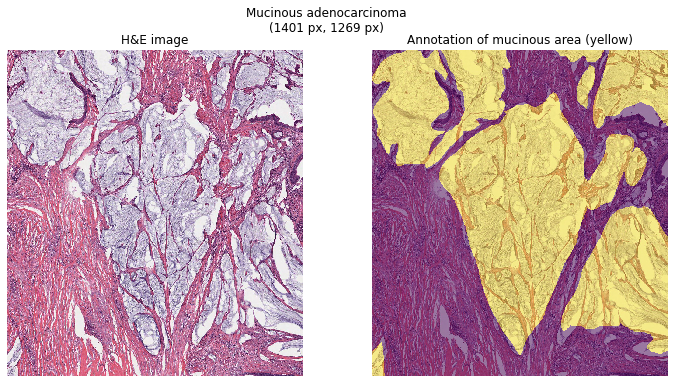

In [3]:
# Load images
path_to_image = os.path.join(data_base_path, data_folder, "mucinous_adeno.jpg")
path_to_gt = os.path.join(data_base_path, data_folder, "mucinous_adeno_gt.jpg")
adeno_img = skimage.io.imread(path_to_image)
adeno_gt = skimage.io.imread(path_to_gt) > 128

# Get size of the image in px
im_h, im_w, im_c = adeno_img.shape

# Display MRI image
fig, ax = plt.subplots(1, 2, figsize=(12, 6))

# Plot image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image')
ax[0].axis('off')

# Plot image with overlay
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')
plt.suptitle("Mucinous adenocarcinoma\n({} px, {} px)".format(im_h, im_w))
plt.show()

---
### 1.2 Thresholding (4pts)
#### 1.2.1 RGB & Hue (1 pts)

Display the histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel. Note that you can use [rgb2hsv](https://scikit-image.org/docs/stable/api/skimage.color.html#skimage.color.rgb2hsv) to convert an RGB image to an HSV image and then extract the hue.

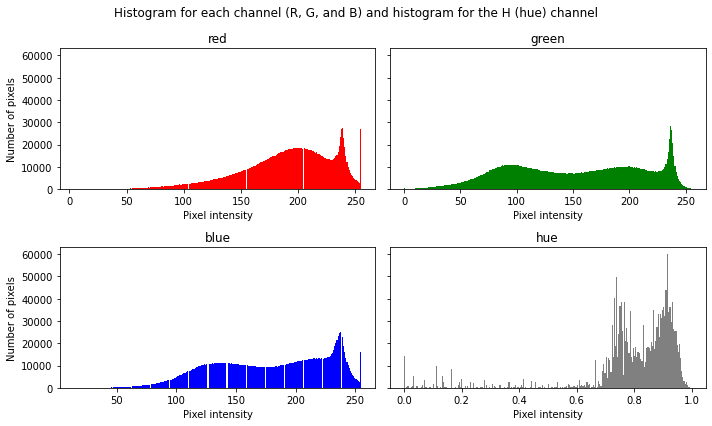

In [4]:
# Change image from rgb to hsv color space
adeno_img_hsv = cv.cvtColor(adeno_img, cv.COLOR_RGB2HSV)

# Plt histogram for each channel (R, G, and B) as well as the histogram for the H (hue) channel
fig, axs = plt.subplots(2, 2, sharey=True, figsize=(10, 6))
axs = axs.flatten()

for ax, c in zip(axs, [(0, 'red'), (1, 'green'), (2, 'blue'), (0, 'hue')]):
    if c[1] != 'hue':
        ax.hist(adeno_img[:,:,c[0]].ravel(), bins=256, color = c[1])
        ax.title.set_text(c[1])
        ax.set_xlabel('Pixel intensity')
        if c[1] != 'green':
            ax.set_ylabel('Number of pixels')
    else:
        ax.hist(color.rgb2hsv(adeno_img)[:,:,c[0]].ravel(), bins=256, color = 'gray')
        ax.title.set_text(c[1])
        ax.set_xlabel('Pixel intensity')
    
fig.suptitle("Histogram for each channel (R, G, and B) and histogram for the H (hue) channel")
plt.tight_layout()
plt.show()

#### 1.2.2 Apply Thresholding (2 pts)

For each histogram find the threshold(s) that work the best to isolate the mucinous area. Display the image after thresholding of each channel as well as the error between your prediction ($im$) and the annotations ($gt$) using the formula:

$$error = 1 - \left( \frac{1}{IJ} \sum_{i,j} im_{i,j} == gt_{i, j} \right)$$

Here, I and J are the dimension of the image.

**For each histogram, we want to find the threshold(s) that work the best in isolating the mucinous area. In the previous section, we saw that most of the histograms resemble bimodals. To find the best threshold, it is thus a good choice to use otsu-binarization as it finds the optimal threshold that minimizes intra-class variance and maximizes inter-class variance.**

red:
The error is 0.45 and the threshold is at gray-value 181.0.
............
green:
The error is 0.26 and the threshold is at gray-value 150.0.
............
blue:
The error is 0.27 and the threshold is at gray-value 175.0.
............
hue:
The error is 0.49 and the threshold is at gray-value 92.0.
............


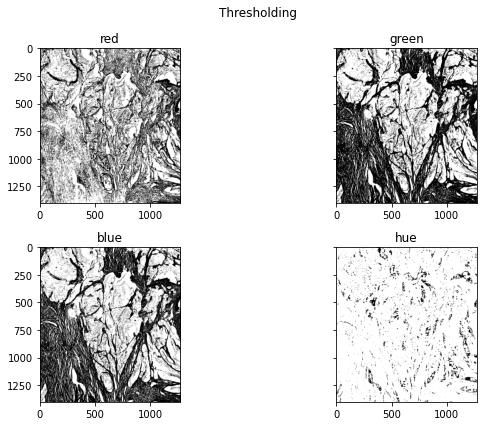

In [5]:
# Function to calculate the error between our prediction and the annotations

def error(im, gt):
    """Calculate the error between our prediction and the annotations.
    
    Arg: 
        im: our image
        gt: annotated image
    
    return:
        the error using the formula above
    """
    I, J = im.shape[0], im.shape[1]
    error = 1 - ((im == np.where(gt==False, 0, 255)).sum() / (I*J))
    return error


# For each histogram: find the threshold, display the image after thresholding and display the error

fig, axs = plt.subplots(2, 2, sharey=True, figsize=(10, 6))
axs = axs.flatten()

for ax, c in zip(axs, [(0, 'red'), (1, 'green'), (2, 'blue'), (0, 'hue')]):
    print(c[1]+':')
    if c[1] != 'hue':
        ret, th = cv.threshold(adeno_img[:,:,c[0]], 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
    else:
        ret, th = cv.threshold(adeno_img_hsv[:,:,c[0]], 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
    print('The error is {} and the threshold is at gray-value {}.'.format(round(error(th, adeno_gt), 2), ret))
    print('............')
    ax.imshow(th, cmap='gray')
    ax.title.set_text(c[1])
          
fig.suptitle("Thresholding")
plt.tight_layout()
plt.show()

#### 1.2.3 Best Thresholding (1 pts)

Based on your previous findings, set the best threshold(s) and create the final mask as the variable `mask_thesholding`

**We saw just before that the green channel had the best thresholding. Thus, we will use its thresholding to create the final mask.**

In [6]:
# Define an empty mask
mask_thesholding = np.zeros_like(adeno_gt)

# Use thresholding on the green channel (1) to create the final mask
ret, th = cv.threshold(adeno_img[:,:,1], 0, 255, cv.THRESH_BINARY+cv.THRESH_OTSU)
mask_thesholding[th[:,:]>0]=1

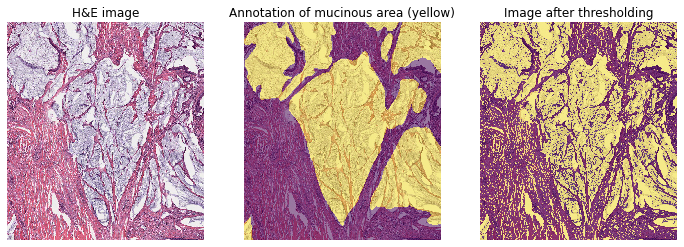

In [7]:
# Display MRI image

fig, ax = plt.subplots(1, 3, figsize=(12, 5))

    # H&E image
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].set_title('H&E image'.format(im_h, im_w))
ax[0].axis('off')

    # Image with the annotation of mucinous area
ax[1].imshow(adeno_img, interpolation='nearest')
ax[1].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[1].set_title('Annotation of mucinous area (yellow)')
ax[1].axis('off')

    # Image after thresholding, using thresholding on the green channel
ax[2].imshow(adeno_img, interpolation='nearest')
ax[2].imshow(mask_thesholding, alpha=0.5, interpolation='nearest')
ax[2].set_title('Image after thresholding')
ax[2].axis('off')

plt.show()

**It can be seen that the segmentation is done correctly but that there are still errors, and in particular small points that are not correct. It is therefore interesting to do some (morphological) post-processing on this segmentation to improve it.**

---

### 1.3 Morphology (5pts)

To proceed, use the best results of the previous model (namely `mask_thesholding`) as the starting point. In this exercise we will try to clean the mask using morphology.

* A (2pts): Try the following operation [closing](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.closing), [opening](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.opening) with [disk](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.disk) size of: $1, 2, 5, 10$. Comment on the quality of the results.

* B (2pts): Try the following operation [remove_small_holes](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_holes), [remove_small_objects](https://scikit-image.org/docs/stable/api/skimage.morphology.html#skimage.morphology.remove_small_objects) with size of: $10, 50, 100, 500$. Comment on the quality of the results.

* C (1pts): Based on your previous results, can you find a combination of the functions that improve your results? Plot the best result along with the error rate. Save the mask as the variable `mask_morph`

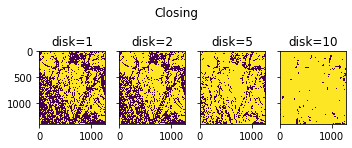

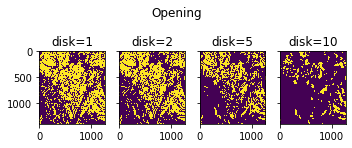

In [8]:
# Question A

    ## Closing with disk size of: 1,2,5,10

fig, axs = plt.subplots(1, 4, sharey=True, figsize=(5, 2))
axs = axs.flatten()

for ax, d in zip(axs, [1, 2, 5, 10]): 
    mask_closing = closing(mask_thesholding, selem=disk(d))
    ax.imshow(mask_closing, interpolation='nearest')
    ax.title.set_text('disk='+str(d))
    
fig.suptitle("Closing")
plt.tight_layout()
plt.show()


    ## Opening with disk size of: 1,2,5,10

fig, axs = plt.subplots(1, 4, sharey=True, figsize=(5, 2))
axs = axs.flatten()

for ax, d in zip(axs, [1, 2, 5, 10]): 
    mask_opening = opening(mask_thesholding, selem=disk(d))
    ax.imshow(mask_opening, interpolation='nearest')
    ax.title.set_text('disk='+str(d))
    
fig.suptitle("Opening")
plt.tight_layout()
plt.show()

**Closing the image translates to enlarging the mask. Closing with bigger disks means the mask is evn more enlarged as the structural element used in the morphological operations is bigger. For a small disk-size, this is good because it makes the mask more uniform. When the disk gets too big however, we lose the segmented part because pixels that should not be included in the mask are "closed" into it.
Concerning opening, the reasoning is similar. This time however, the disk removes protrusions instead of filling holes. When the disk gets too big, the entire mucinous area will be seen as 'a protrusion' and will thus be removed.  
The best result seems to be closing with a disk-size 2.**

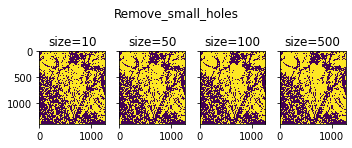

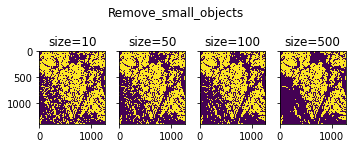

In [9]:
# Question B

    ## Remove_small_holes with size of: 10,50,100,500

fig, axs = plt.subplots(1, 4, sharey=True, figsize=(5, 2))
axs = axs.flatten()

for ax, s in zip(axs, [10, 50, 100, 500]): 
    mask_holes = remove_small_holes(mask_thesholding, area_threshold=s)
    ax.imshow(mask_holes, interpolation='nearest')
    ax.title.set_text('size='+str(s))
    
fig.suptitle("Remove_small_holes")
plt.tight_layout()
plt.show()


    ## Remove_small_objects with size of: 10,50,100,500

fig, axs = plt.subplots(1, 4, sharey=True, figsize=(5, 2))
axs = axs.flatten()

for ax, s in zip(axs, [10, 50, 100, 500]): 
    mask_objects = remove_small_objects(mask_thesholding, min_size=s)
    ax.imshow(mask_objects, interpolation='nearest')
    ax.title.set_text('size='+str(s))
    
fig.suptitle("Remove_small_objects")
plt.tight_layout()
plt.show()

**remove_small_holes makes the inside of the mask more smooth, similarly to mask closing. As the size of the holes to close grows, the mask becomes smoother and smoother. A downside of this method is that the mask's borders are knibbled away.
For remove_small_objects, the reasoning is the opposite. This is good for background smoothing but knibbles away parts of the mask.**

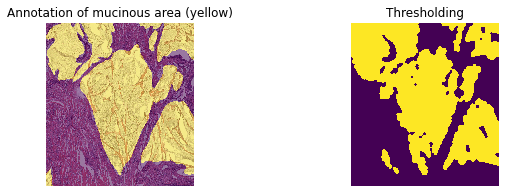

The error is 0.11.


In [10]:
# Question C

fig, ax = plt.subplots(1, 2, figsize=(10, 3))

    # 1. Annotated image
    
ax[0].imshow(adeno_img, interpolation='nearest')
ax[0].imshow(adeno_gt, alpha=0.5, interpolation='nearest')
ax[0].set_title('Annotation of mucinous area (yellow)')
ax[0].axis('off')

    # 2. Our image

# find a combination of the functions that improve the results
transf1 = closing(mask_thesholding, selem=disk(2))
transf2 = opening(transf1, selem=disk(3))
transf3 = remove_small_holes(transf2, area_threshold=550000)
transf4 = remove_small_objects(transf3, min_size=10000)
transf5 = closing(transf4, selem=disk(10))
transf6 = opening(transf5, selem=disk(15))
mask_morph = transf6

# plot the results
ax[1].imshow(mask_morph, interpolation='nearest')
ax[1].imshow(mask_morph, alpha=0.5, interpolation='nearest')
ax[1].set_title('Thresholding')
ax[1].axis('off')

plt.show()

    # 3. display the error
    
def error(im, gt):
    I, J = im.shape[0], im.shape[1]
    error = 1 - ((im == gt).sum() / (I*J))
    return error

print('The error is {0:.2f}.'.format(error(mask_morph, adeno_gt)))

**We can see that morphological post-processing has drastically improved the previous segmentation. In particular, the mask and "background" are no longer dotted.**

---
### 1.4 Region growing (5pts)

In this exercise you will implement from scratch your own region growing algorithm. Choose one of the image channel (R/G/B/H) as the source image. You can use multiple seed point to achieve better results. Plot the best result along with the error rate. Save the mask as the variable `mask_region`.

====== Binary region growing =======


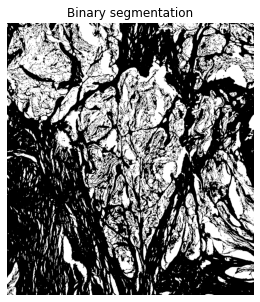

In [11]:
def grow_binary_regions(grayImg, maxDeviation, breakPercentage):
    '''
    Function to segment an image into two regions.
    Input: 
        - grayImg: image to be segmented, must be in grayscale (2d matrix)
        - maxDeviation: How much (in grayscale value) can a point differ from the average of a region to be included
        - breakPercentage: When a large part of the image is segmented, progress is slow. Once breakPercentage% of 
                            the pixels is assigned to a region, the rest of the pixels is assigned to region 0.
    Output:
        - A binary mask of the same size as grayImg that segments the image into two regions.
    '''
    # Initialize a mask. A value inf means a pixel is not yet assigned to a region
    mask = np.inf*np.ones_like(grayImg)
    dimensions = grayImg.shape
    
    # Take a random seed to start growing a region from
    seed = (random.randint(0,dimensions[0]-1), random.randint(0,dimensions[1]-1))

    # Queue that contains all pixels at the border of a growing region
    point_queue = deque()
    point_queue.append(seed)
    
    '''
    Assign the seed to region 1 or 0 according to its distance from the edge of the grayscale-range
    
    Instantiate the avgs-dict to keep track of the average grayscale-value of each region.
        - The keys are the regions
        - The values are tuples with as * element 0: the number of pixels in the region
                                        * element 1: the average grayscale-value of the region
    Set the mask at the position of the seed
    Define the 'region' variable, which keeps track of which region is growing
    '''
    if np.sign(grayImg[seed[0], seed[1]]-255/2) == 1:
        avgs = {1: (1, grayImg[seed[0], seed[1]]), 0: (0,0)}
        mask[seed[0], seed[1]] = 1
        region = 1
    else:
        avgs = {0: (1, grayImg[seed[0], seed[1]]), 1: (0,1)}
        mask[seed[0], seed[1]] = 0
        region = 0

    # Variable to print percentage of treated pixels (we only print when the percentage changes during an iteration)
    percentage = 0
    
    # Keep on growing regions until breakPercentage of the pixels is assigned
    while np.sum([a[0] for a in avgs.values()]) <= breakPercentage/100*grayImg.size:
        old_percentage = percentage
        
        # Keep growing this region until the queue with non-treated border points is empty
        while len(point_queue) != 0:
            # Get border point that will be treated
            point = point_queue.popleft()
            
            # Get all neighbours of this point that are inside the image and not yet treated
            neighbours = filter(lambda co: (0<=co[0]<dimensions[0]) and (0<=co[1]<dimensions[1]) and (mask[co[0], co[1]] == np.inf),[(point[0]+1,point[1]), (point[0]-1,point[1]), (point[0], point[1]+1), (point[0], point[1]-1)])
            
            for neighbour in neighbours:
                # If neighbour sattisfies the condition to be included into the region
                if abs(avgs[region][1]-grayImg[neighbour[0], neighbour[1]]) <= maxDeviation:
                    point_queue.append(neighbour)
                    mask[neighbour[0], neighbour[1]] = region
                    avgs[region] = (avgs[region][0]+1, (np.prod(avgs[region])+grayImg[neighbour[0], neighbour[1]])/(avgs[region][0]+1))

        # Region is done growing. To start growing a new region, generate a new seed at a pixel that is not yet treated
        seed = (random.randint(0,dimensions[0]-1), random.randint(0,dimensions[1]-1))
        while mask[seed[0], seed[1]] != np.inf:
            seed = (random.randint(0,dimensions[0]-1), random.randint(0,dimensions[1]-1))

        point_queue.append(seed)
        # Assign the new region that will be grown to region 0 or 1 based on which average is closest to the value at the seed
        region = np.argmin([abs(avgs[0][1]-grayImg[seed[0], seed[1]]), abs(avgs[1][1]-grayImg[seed[0], seed[1]])])
        mask[seed[0], seed[1]] = region
        avgs[region] = (avgs[region][0]+1, (np.prod(avgs[region])+grayImg[neighbour[0], neighbour[1]])/(avgs[region][0]+1))

        # Print how much pixels are treated 
        percentage = int(100*(avgs[0][0]+avgs[1][0])/grayImg.size)
        # if percentage != old_percentage:
        #     print(f'Already {int(100*(avgs[0][0]+avgs[1][0])/grayImg.size)}% treated!')

    # BreakPercentage pixels are treated, the rest will be assigned to region 0
    remove_infs = np.vectorize(lambda x: 0 if x==np.inf else x)
    mask = remove_infs(mask)
    return mask

def still_regions_to_merge(avgs, cond):
    '''
    helper function for grow_multiple_regions
    input: elements from avgs dict
    output: 
            - are there regions with an average nearby (distance < cond) eachother
            - names (indices in avgs dict) of the regions that need to be merged according to above
    '''
    for iIdx,i in avgs:
        for jIdx,j in avgs:
            if (i[1]!= j[1]) and (abs(i[1]-j[1])<cond):
                return True, (iIdx,jIdx)
    return False, None

def grow_multiple_regions(grayImg, regionSize, breakPercentage):
    '''
    This function divides the grayscale image in multiple regions. 
    It was added for completeness but not optimised (it is very slow!) and not used in this report
    
    It works very similar to grow_binary_regions, so see the comments in that function to understand working of this one.
    '''
    mask = 255*np.ones_like(grayImg)
    dimensions = grayImg.shape

    seed = (random.randint(0,dimensions[0]-1), random.randint(0,dimensions[1]-1))

    points_queue = deque()
    points_queue.append(seed)

    region = 1
    avgs = {region: (1, grayImg[seed[0], seed[1]])}
    mask[seed[0], seed[1]] = region

    percentage = 0
    while np.sum([a[0] for a in avgs.values()]) <= breakPercentage/100*grayImg.size:
        old_percentage = percentage
        while len(points_queue) != 0:
            pixel = points_queue.popleft()
            regionNb = mask[pixel[0], pixel[1]]
            neighbours = filter(lambda co: (0<=co[0]<dimensions[0]) and (0<=co[1]<dimensions[1]),[(pixel[0]+1,pixel[1]), (pixel[0]-1,pixel[1]), (pixel[0], pixel[1]+1), (pixel[0], pixel[1]-1)])
            regionAvg = avgs[regionNb][1]
            for neighbour in neighbours:
                if abs(regionAvg-grayImg[neighbour[0], neighbour[1]]) <= regionSize/2:
                    if (mask[neighbour[0], neighbour[1]] != 255) and (mask[neighbour[0], neighbour[1]] != regionNb):
                        regionToMerge = mask[neighbour[0], neighbour[1]]
                        merge = np.vectorize(lambda x: regionNb if x==regionToMerge else x)
                        mask = merge(mask)
                        avgs[regionNb] = (avgs[regionNb][0]+avgs[regionToMerge][0], (np.prod(avgs[regionNb]) + np.prod(avgs[regionToMerge]))/(avgs[regionNb][0]+avgs[regionToMerge][0]))
                        del avgs[regionToMerge]
                    elif mask[neighbour[0], neighbour[1]] == 255:
                        mask[neighbour[0], neighbour[1]] = regionNb
                        points_queue.append((neighbour[0], neighbour[1]))
                        avgs[regionNb] = (avgs[regionNb][0]+1, (np.prod(avgs[regionNb])+grayImg[neighbour[0], neighbour[1]])/(avgs[regionNb][0]+1))

        # Add new seed
        newSeed = (random.randint(0,dimensions[0]-1), random.randint(0,dimensions[1]-1))
        while mask[newSeed[0], newSeed[1]] != 255:
            newSeed = (random.randint(0,dimensions[0]-1), random.randint(0,dimensions[1]-1))
        points_queue.append(newSeed)
        region += 1
        mask[newSeed[0],newSeed[1]] = region
        avgs[region] = (1,grayImg[newSeed[0], newSeed[1]])

        percentage = int(100*np.sum([a[0] for a in avgs.values()])/grayImg.size)
        if percentage != old_percentage:
            print(f'Already {int(100*np.sum([a[0] for a in avgs.values()])/grayImg.size)}% treated!')

    # Merge regions
    stillMerge, regionsToMerge = still_regions_to_merge(avgs.items(), regionSize/2)
    while stillMerge:
        regionNb, regionToMerge = regionsToMerge
        merge = np.vectorize(lambda x: regionNb if x==regionToMerge else x)
        mask = merge(mask)
        avgs[regionNb] = (avgs[regionNb][0]+avgs[regionToMerge][0], (np.prod(avgs[regionNb]) + np.prod(avgs[regionToMerge]))/(avgs[regionNb][0]+avgs[regionToMerge][0]))
        del avgs[regionToMerge]
        stillMerge, regionsToMerge = still_regions_to_merge(avgs.items(), regionSize/2)

    nbRegions = len(avgs.keys())
    remove_255s = np.vectorize(lambda x: 0 if x==255 else x)
    mask = remove_255s(mask)
    return mask, nbRegions

grayImg = cv.cvtColor(adeno_img, cv.COLOR_RGB2GRAY)

print('====== Binary region growing =======')
mask_region = grow_binary_regions(grayImg, 40, 80)
fig, ax = plt.subplots(1, 1, figsize=(12, 5))

ax.imshow(mask_region, cmap='gray')
ax.set_title('Binary segmentation')
ax.axis('off')

plt.show()

---
### 1.5 Method comparison (1pt)

In this section we display the overall outputs. Please make sure that you create the variables `mask_thesholding`, `mask_morph`, and `mask_region` to properly display the output. Comment on the results and what you think would be the best approach.

**As can be seen from the pictures below, thresholding and region growing give out a similar result. The real key process here is the post-processing morphology which closes holes and removes small objects in the background. The ideal approach would thus be to first grow regions or threshold and then post-process with morphology.**

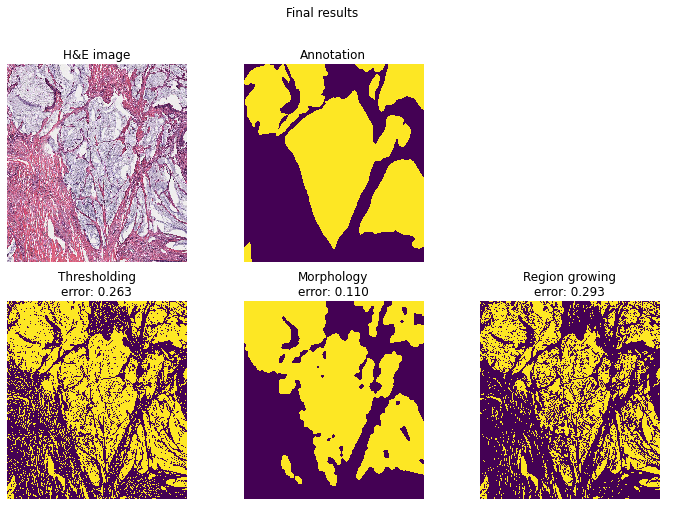

In [12]:
error_th = 1- (mask_thesholding == adeno_gt).mean()
error_morph = 1- (mask_morph == adeno_gt).mean()
error_region = 1- (mask_region == adeno_gt).mean()

# Display MRI image
fig, ax = plt.subplots(2, 3, figsize=(12, 8))

    # Plot image
ax[0, 0].imshow(adeno_img, interpolation='nearest')
ax[0, 0].set_title('H&E image'.format(im_h, im_w))

    # Plot image with overlay
ax[0, 1].imshow(adeno_gt, interpolation='nearest')
ax[0, 1].set_title('Annotation')

    # Plot estimation using thresholding
ax[1, 0].imshow(mask_thesholding, interpolation='nearest')
ax[1, 0].set_title('Thresholding\nerror: {:.3f}'.format(error_th))

    # Plot estimation using Contour detection
ax[1, 1].imshow(mask_morph, interpolation='nearest')
ax[1, 1].set_title('Morphology\nerror: {:.3f}'.format(error_morph))

    # Plot estimation using Region growing
ax[1, 2].imshow(mask_region, interpolation='nearest')
ax[1, 2].set_title('Region growing\nerror: {:.3f}'.format(error_region))

[a.axis('off') for a in ax.ravel()]

plt.suptitle("Final results")
plt.show()

# ---
## Part 2: Axon segmentations (10 points)

#### Intro 

Axon segmentation is vital to neuroscience research as it enables the study of neurons' morphology and connectivity. We will conduct two exercises to evaluate the impact of your segmentation algorithms under different independent artefacts. Each exercise consists of a synthetic **Ground Truth (GT)** and two more images simulating a specific artifact.

The **Ground Truth**  has tree main compartments. 1) The inner part of the axon. 2) The outer layer of the axon (called myelin) and the extracellular slace (the background of the image). 

The task consists into segmenting the three main compartments in the image to compute the inner-axon and outer-axon radii distribution.


To compute the radii, we suggest the following approximation.
$$\hat{r}_{I}= \sqrt{\frac{A_{yellow}}{\pi}}$$
$$\hat{r}_{O}= \sqrt{\frac{A_{yellow} + A_{blue}}{\pi}}$$
Where **A** is the corresponding area of the comparments. 
**Using this image as reference** 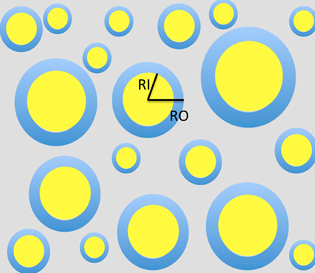

#### Artifacts simulated:

Excercise 1) Two images with different levels of SNR (signal to noise ratio). The images have rician noise.
Exercise  2) Two images adquired using a fraction of the fourier space. Only Lowest frequency are used to reconstruct the image. (simulating fast aquisitions in MRI)

Ensure your algorithm works on the GT before you go to the test cases with artifacts. Apply any preprocessing needed to the image. The preprocessing can be different for each type of image.

### Tasks

For each exercise we ask to:

1) Segment the images with the following colors: blue the inner part of the axon, red the outer part of the axon (myelin) and white for the backround(example) 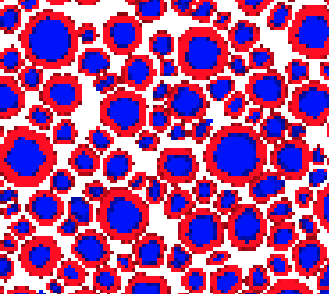

2) Count the number of axons obtained in the sample, calculate the radii for each axons, and display a radii histogram for the each of the images(GT and test cases).

In the exercises, assume that each pixel side is $(0.1 \mu m)$, i.e. a pixel has an area of $(0.01 \mu m^2 )$

## Grading 
The answers does not have to be perfect, they just be a good approximation.

1. Developing an algorithm that works for the two GT images. **(3 points)** 
2. Use preprosesing to prepare the images with SNR and the Low frequencies.  (**1 point** for SNR preprocesing , **1 point** for Low-frequency images preprocesing)
3. Running the algorithm in the test images. **1/2 point** SNR, **1/2 point** Low freqs
4. Computing and plotting radii distributions **(1 point)**
5. Explaining and discussing your implementation. **(3 points )**
    Try to be specific, not necessarily long. In the discussion include:
 1. What worked? 
 2. What did not work?
 3. Why do you think it does not work? 
 4. How could you improve your algorithms as future work?  Try to avoid general comments like "using deep learning" 
 
**Extra points: Real data example (3 points), the algorithm should display a _good enough_ segmentation.**

### 2.1 SNR

../data/lab-01-data/


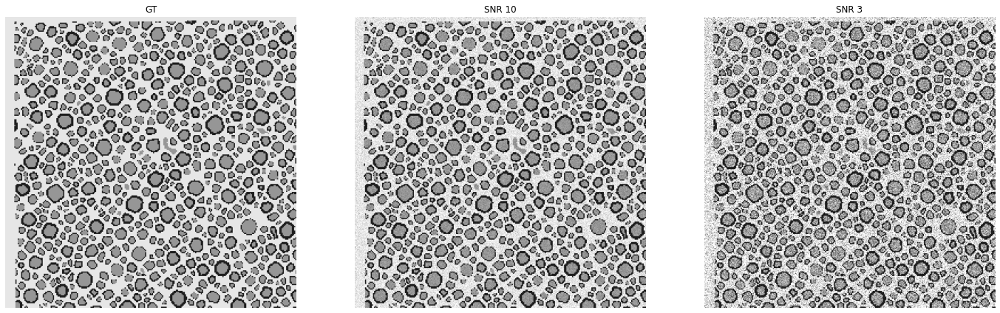

In [13]:
# Load data

data_base_path = os.path.join('../data')
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 
print(path_folder)

files = ["GT_0.png"  , "test_0_0.png" , "test_0_1.png"]
gt_0 = cv.imread(path_folder+ files[0])
snr_10 = cv.imread(path_folder+ files[1])
snr_3 = cv.imread(path_folder+ files[2])

# Plot images

images = [gt_0 , snr_10, snr_3]
im_names = ["GT" , "SNR 10" , "SNR 3"]

fig, axes = plt.subplots(1, 3, figsize=(24, 12))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)

plt.show()

### 2.1.1 Preprocessing 

 % add your images after preprocessing


**It can be seen that the images have noise in the form of small dots dotting the image (salt&pepper noise). The use of a median filter to pre-process and attenuate the noise may therefore be a good idea.**

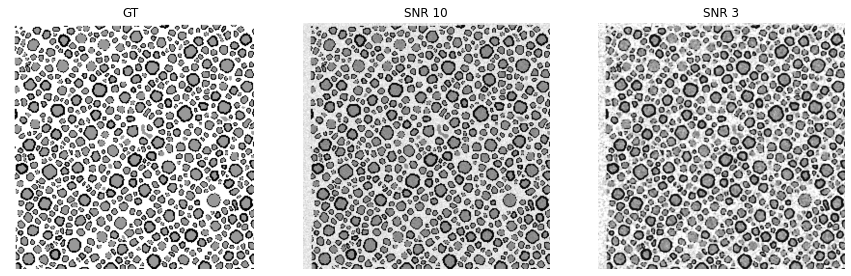

In [14]:
# Switch to greyscale image and check result:
images_gray = images.copy()
for i,im in enumerate(images):
    images_gray[i] = color.rgb2gray(im)

# Apply a median filter to remove noise
images_wo_noise = images_gray.copy()
images_wo_noise[0] = images_gray[0]
images_wo_noise[1] = median(images_gray[1], disk(1))
images_wo_noise[2] = median(images_gray[2], disk(2))

# Plot results
fig, axes = plt.subplots(1, 3, figsize=(15, 7))
for ax, im, nm in zip(axes.ravel(), images_wo_noise, im_names):
    ax.imshow(im[0:512,0:512],cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

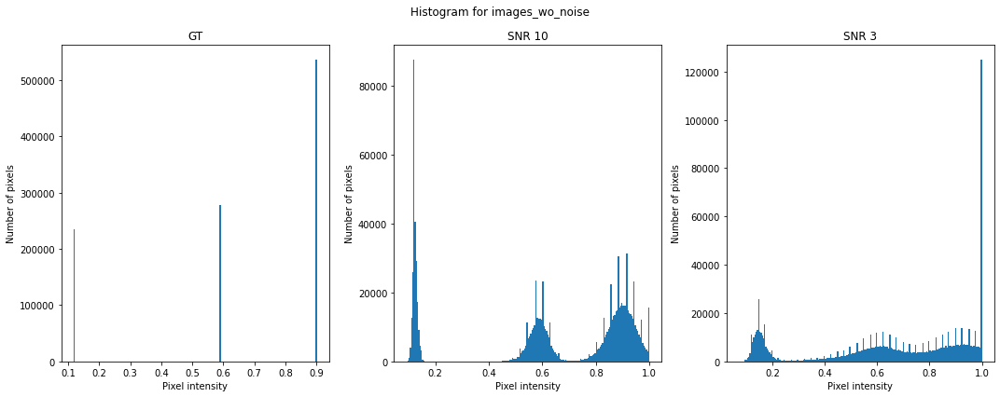

In [15]:
# Display histograms for each image

fig, axs = plt.subplots(1, 3, sharey=False, figsize=(15, 6))
axs = axs.flatten()

for ax, im, nm in zip(axs, images_wo_noise, im_names):
    ax.hist(im.ravel(), bins=200)
    ax.title.set_text(nm)
    ax.set_xlabel('Pixel intensity')
    ax.set_ylabel('Number of pixels')
    
fig.suptitle("Histogram for images_wo_noise")
plt.tight_layout()
plt.show()


### 2.1.2 Results Segmentations

In [16]:
# Function to do the segmentation with multiple thresholds, and plot the results

def segmentation(images_wo_noise):
    """Do the segmentation and plot the results.
    
    Arg:
        images_wo_noise: list with the three images after pre-processing
        
    return: 
        List with the three thresholded images
    """
    images_th = images_wo_noise.copy()
    th = []

    # Thresholding
    for i, im in enumerate(images_wo_noise):
        # Applying multi-Otsu threshold for the default value, generating three classes
        th.append(threshold_multiotsu(im,3,300)) 
        # Using the threshold values, we generate the three regions
        images_th[i] = np.digitize(im, bins=th[i])


    # Plotting results of segmentation
    palette = np.array([[255,   0,   0],   # red
                        [  0,   0, 255],   # blue
                        [255, 255, 255]])  # white

    images_RBW = [palette[images_th[0]],palette[images_th[1]] ,palette[images_th[2]]] # images in Red Blue White

    im_names = ["GT" , "SNR 10" , "SNR 3"]
    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    for ax, im, nm in zip(axes.ravel(), images_RBW, im_names):
        ax.imshow(im[0:512,0:512])
        ax.axis('off')
        ax.set_title(nm)
    fig.suptitle("Segmentation")
    plt.tight_layout()
    plt.show()


    # Plotting the histogram and the two thresholds obtained from multi-Otsu on images_wo_noise
    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    for ax, im, nm, i in zip(axes.ravel(), images_wo_noise, im_names, [0,1,2]):
        ax.hist(im.ravel(), bins=100)
        ax.set_title(nm)
        for thresh in th[i]:
            ax.axvline(thresh, color='r')
    fig.suptitle("Thresholds applied on histograms of images_wo_noise")
    plt.tight_layout()
    plt.show()    


    # Plotting the histogram of thresholded images (images_th)
    fig, axes = plt.subplots(1, 3, figsize=(15, 3))
    for ax, im, nm, i in zip(axes.ravel(), images_th, im_names, [0,1,2]):
        ax.hist(im.ravel(), bins=100)
        ax.set_title(nm)
    fig.suptitle("Histograms of thresholded images")
    plt.tight_layout()
    plt.show() 
    
    return images_th

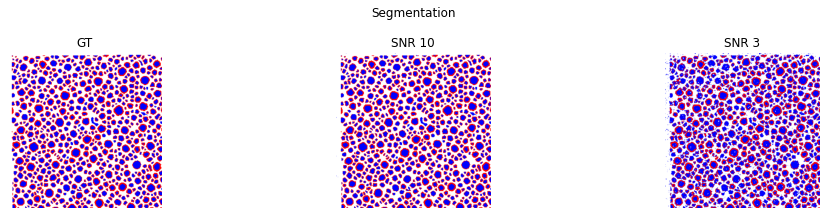

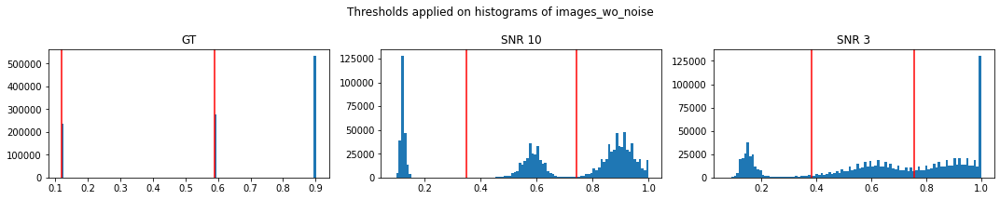

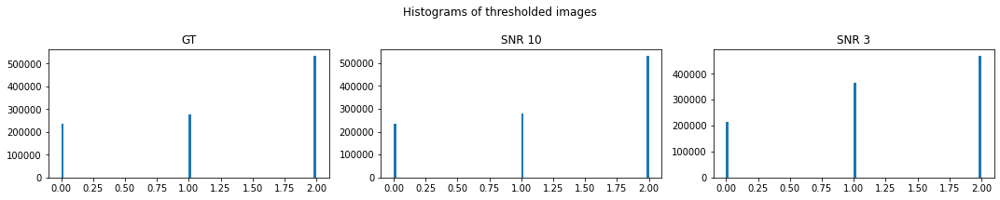

In [17]:
# Apply segmentation to each image
images_th = segmentation(images_wo_noise)

### 2.1.3 Radii histograms 

In [18]:
# Function to find the radii (inner and outer) in one image
def radii(th_im):
    """Find radii in the image.
    
    Arg:
        th_im: multi-thresholded image
    
    return:
       cv.cvtColor(th_im8_i, cv.COLOR_GRAY2BGR): thresholded image with inner contours
       cv.cvtColor(th_im8_o, cv.COLOR_GRAY2BGR): thresholded image with outer contours
       Cs_i: array of inner contours
       Cs_o: array of outer contours
       Rs_i: array with inner radii
       Rs_o: array with outer radii
    """
    # Convert image to 8 bit and binary for inner and outer areas of the objects
    th_im8_i = cv.convertScaleAbs(np.where(th_im==1, 255, 0))
    th_im8_o = cv.convertScaleAbs(np.where(th_im==0, 255, 0))
    
    # Detect inner and outer contours
    Cs_i, _ = cv.findContours(th_im8_i, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_SIMPLE)
    Cs_o, _ = cv.findContours(th_im8_o, mode=cv.RETR_TREE, method=cv.CHAIN_APPROX_SIMPLE)
    
    # Calculate radii for each object
    Rs_i = np.empty(0)
    Rs_o = np.empty(0)
    temp = [cv.contourArea(i) for i in Cs_o]
    for C_i, C_o in zip(Cs_i, Cs_o):
        A_i = cv.contourArea(C_i)
        A_o = cv.contourArea(C_o)
        R_i = np.sqrt(A_i*0.01/np.pi)
        R_o = np.sqrt((A_i+A_o)*0.01/np.pi)
        Rs_i=np.append(Rs_i,np.array([R_i]),axis=0)
        Rs_o=np.append(Rs_o,np.array([R_o]),axis=0)
    
    return cv.cvtColor(th_im8_i, cv.COLOR_GRAY2BGR), cv.cvtColor(th_im8_o, cv.COLOR_GRAY2BGR), Cs_i, Cs_o, Rs_i, Rs_o


# Apply radii function to each image, get all radii and check contours (plot)
def get_all_radii(images_th):
    """Apply radii to each image, get all radii and check contours.
    
    Arg:
        images_th: list with the three multi-thresholded images
    
    return: 
        all_rads: list that contain [Rs_i, Rs_o] for each image, [Rs_i, Rs_o] being array with inner and outer radii
    """
    fig, axes = plt.subplots(3, 2, figsize=(17, 15))
    all_rads = []

    for ax, im, nm in zip([0, 1, 2], images_th, im_names):
        
        # Apply radii to the image and save array with radii
        th_im8_i, th_im8_o, Cs_i, Cs_o, Rs_i, Rs_o = radii(im)
        all_rads.append([Rs_i, Rs_o])

        # Print number of radii in the image
        print("For {}: There are {} radii.".format(nm, len(Rs_i)))

        # Plot inner contours
        axes[ax,0].imshow(cv.drawContours(th_im8_i, Cs_i, -1, (0, 255, 0), 1))
        axes[ax,0].axis('off')
        axes[ax,0].set_title(nm+': inner')

        # Plot outer contours
        axes[ax,1].imshow(cv.drawContours(th_im8_o, Cs_o, -1, (255, 0, 0), 1))
        axes[ax,1].axis('off')
        axes[ax,1].set_title(nm+': outer')

    fig.suptitle("Contours")
    plt.tight_layout()
    plt.show()
    
    return all_rads

For GT: There are 2828 radii.
For SNR 10: There are 4126 radii.
For SNR 3: There are 7075 radii.


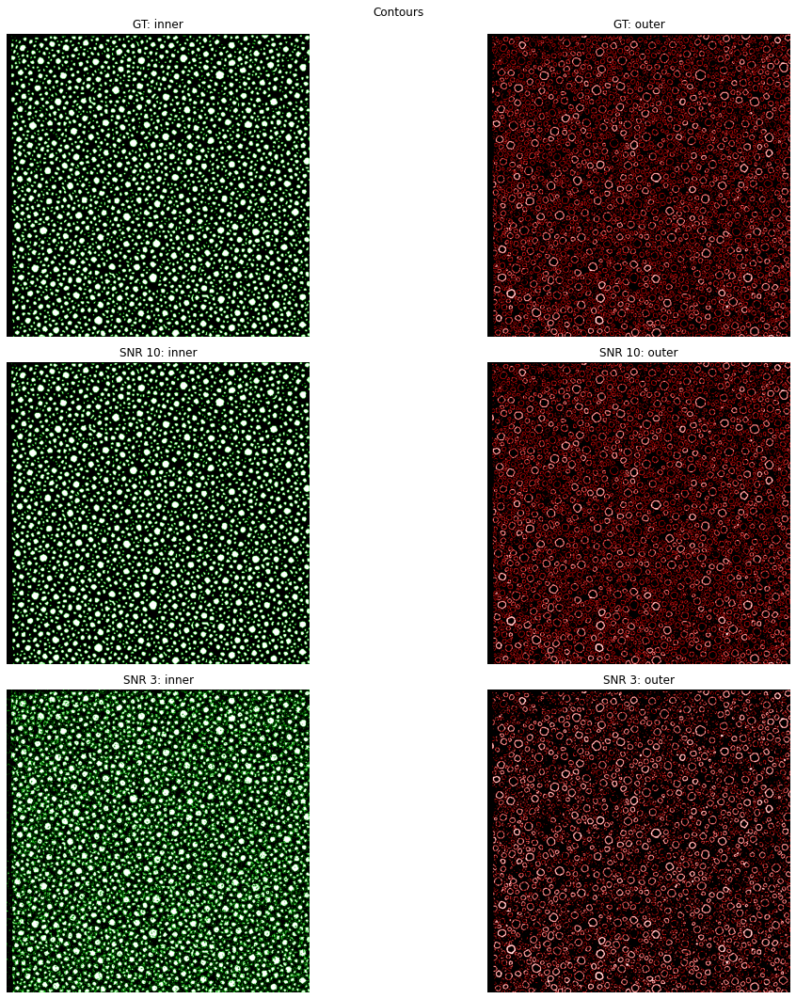

In [19]:
# Apply radii to each image, get all radii and check contours
all_rads = get_all_radii(images_th)

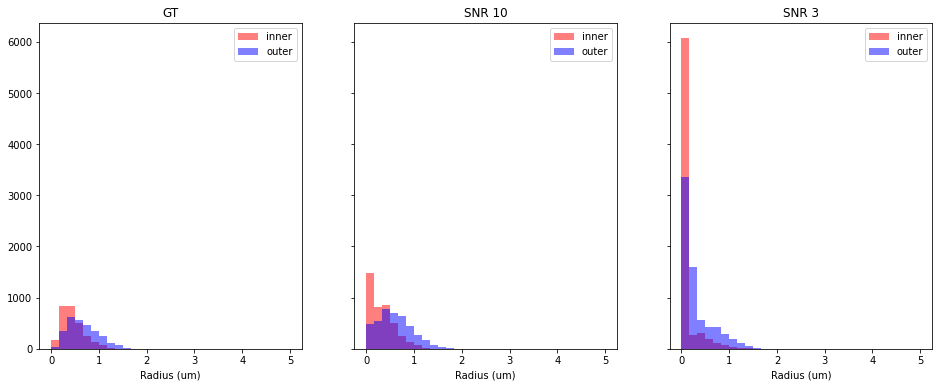

In [20]:
# Plot radii distributions for each image

fig, axes = plt.subplots(1, 3, figsize=(16, 6),sharey=True)

for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0], color="red", label="inner", alpha=0.5, bins=30,range=(0,5))
    ax.hist(rads[1], color="blue", label="outer", alpha=0.5, bins=30,range=(0,5))
    ax.legend()
    ax.set_title(nm)
    ax.set_xlabel("Radius (um)")
    
plt.show()

**Implemented procedure to calculate these radii distribution:**
- **We use a multi-thresholding to make a segmentation of the image in three zones: background, outer part of the axon and inner part of the axon**.
- **We then isolate the segmentation of the outer part to detect the contours and compute the area. The same is done for the inner part of the axons**.
- **The formula given in the statement is then used to calculate the outer and inner radii**.

**The preprocessing worked quite well as expected from median filtering on a rician type of noise. Thereafter, segmentation using thresholding was quite adequate for SNR10 given the clear 3-class separation that can be observed on histograms. However, SNR3 proved to have histograms with very little class separation, which might explain the absurdly high radii count that followed. Concerning the latter, it can be hypothetised that added noise in fact increases the number of (small) contours, with higher noise creating many more small contours and thus disturbing the radii distribution.**

**Among the possible solutions, we could think of either improving the pre-processing to better remove the noise from the images, or having a segmentation method that "adapts" much more to the image and the noise.**

### 2.2 Low frequencies

../data/lab-01-data/


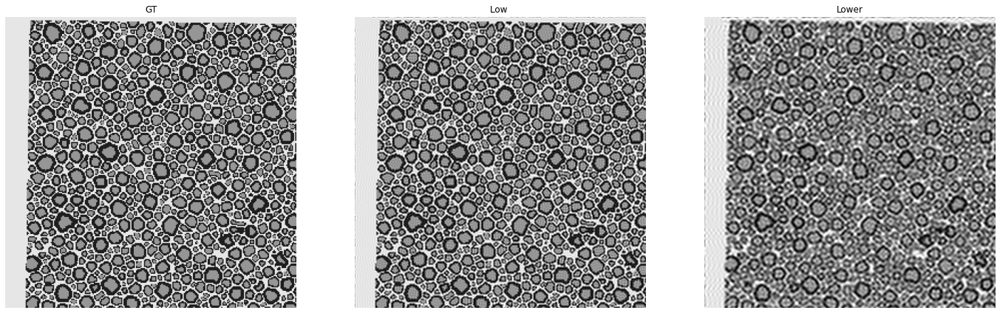

In [21]:
# Load data

data_base_path = os.path.join('../data')
data_folder = 'lab-01-data'

path_folder = os.path.join(data_base_path, data_folder) + '/' 
print(path_folder)

files = ["GT_3.png"  , "test_3_0.png" , "test_3_1.png"]
path = "data/"
gt_3 = cv.imread(path_folder+ files[0])
lowfreq0 = cv.imread(path_folder+ files[1])
lowfreq1 = cv.imread(path_folder+ files[2])


# Plot images

images = [gt_3 , lowfreq0, lowfreq1]
im_names = ["GT" , "Low " , "Lower"]
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images, im_names):
    ax.imshow(im[0:512,0:512])
    ax.axis('off')
    ax.set_title(nm)
plt.show()

### 2.2.1 Preprocessing

**We can see that here the noise added to the images gives a blurred effect (resulting from a low-pass filter). Using a wiener filter can be a solution here as it attempts to apply the inverse filter to retrieve the original image.**

Filtered images:


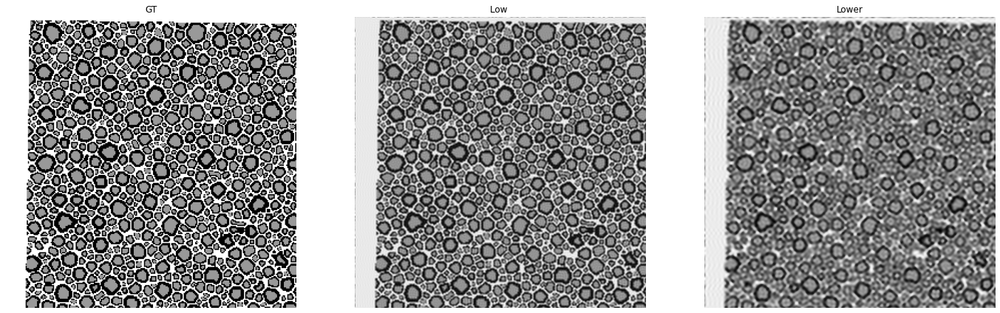

Original images:


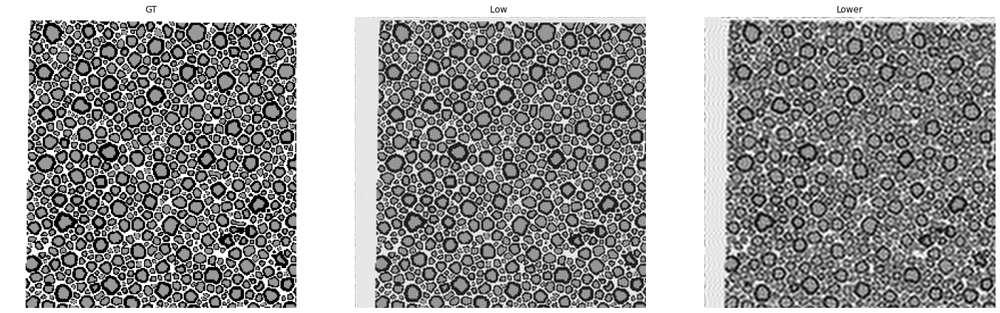

In [22]:
# Switch to greyscale image and check result:
images_gray = images.copy()
for i,im in enumerate(images):
    images_gray[i] = color.rgb2gray(im)

# Filter image using Wiener filter to try and remove the blurring effect
filtered_imgs = images_gray.copy()
filtered_imgs[1] = wiener(filtered_imgs[1],3)
filtered_imgs[2] = wiener(filtered_imgs[2],5)

# Show filtered images and original images

    # Filtered images
print("Filtered images:")
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), filtered_imgs, im_names):
    ax.imshow(im[0:512,0:512],cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

    # Original images
print("Original images:")
fig, axes = plt.subplots(1, 3, figsize=(24, 24))
for ax, im, nm in zip(axes.ravel(), images_gray, im_names):
    ax.imshow(im[0:512,0:512],cmap='gray')
    ax.axis('off')
    ax.set_title(nm)
plt.show()

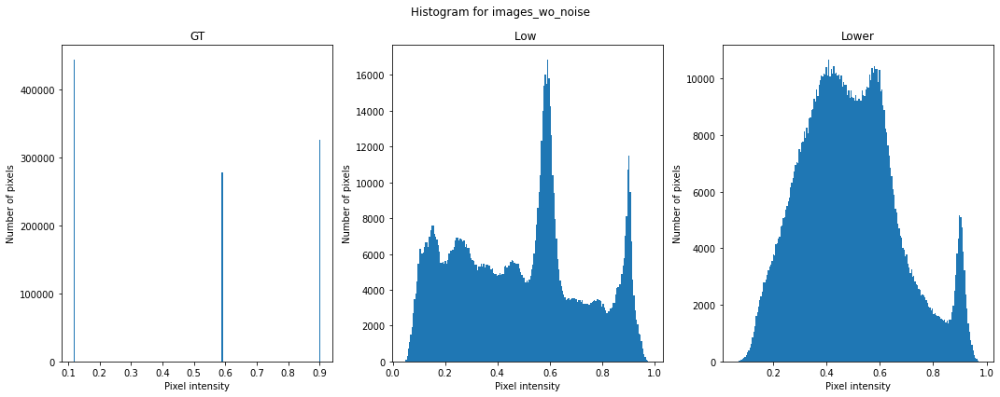

In [23]:
# Display histograms

fig, axs = plt.subplots(1, 3, sharey=False, figsize=(15, 6))
axs = axs.flatten()

for ax, im, nm in zip(axs, filtered_imgs, im_names):
    ax.hist(im.ravel(), bins=200)
    ax.title.set_text(nm)
    ax.set_xlabel('Pixel intensity')
    ax.set_ylabel('Number of pixels')
    
fig.suptitle("Histogram for images_wo_noise")
plt.tight_layout()
plt.show()

### 2.2.2 Results Segmetations


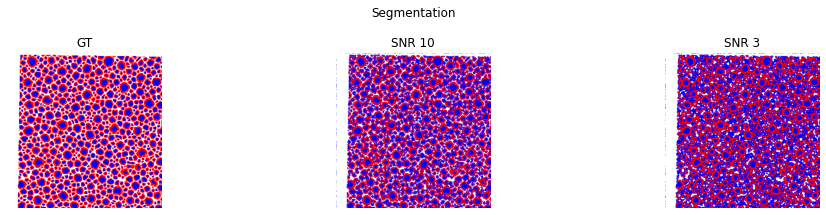

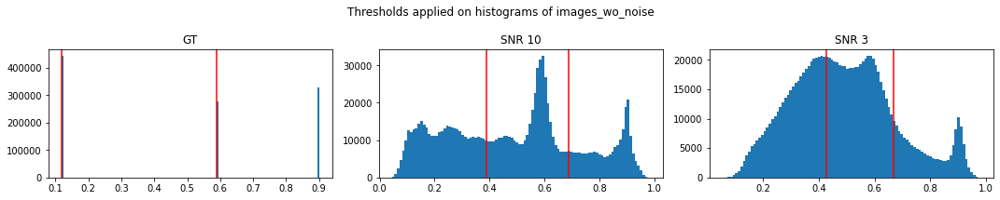

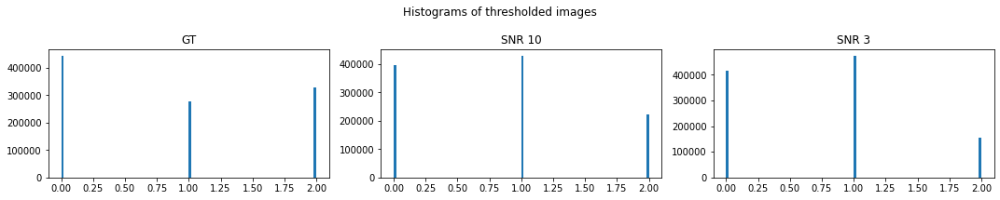

In [24]:
# Apply segmentation to the pre-porcessed images
images_th = segmentation(filtered_imgs)

### 2.2.3 Radii histrograms

For GT: There are 3435 radii.
For Low : There are 5740 radii.
For Lower: There are 2984 radii.


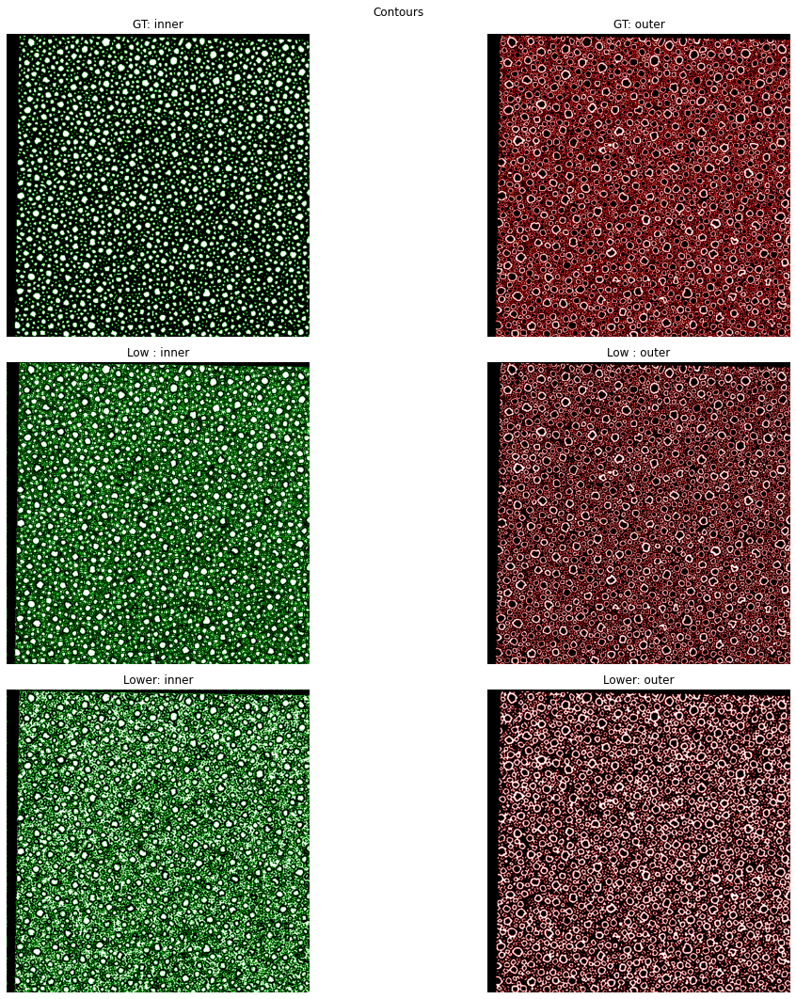

In [25]:
# Apply radii to each image, get all radii and check contours
all_rads = get_all_radii(images_th)

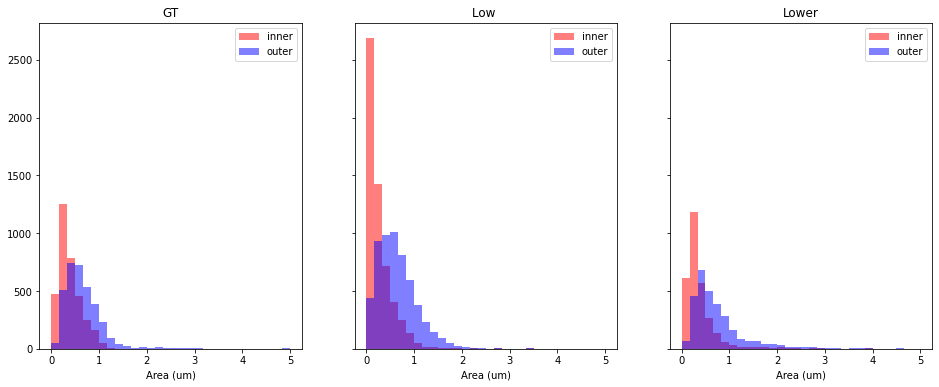

In [26]:
# Radii distributions

fig, axes = plt.subplots(1, 3, figsize=(16, 6), sharey=True)

for ax, rads, nm in zip(axes.ravel(), all_rads, im_names):
    ax.hist(rads[0], color="red", label="inner", alpha=0.5, bins=30,range=(0,5))
    ax.hist(rads[1], color="blue", label="outer", alpha=0.5, bins=30,range=(0,5))
    ax.legend()
    ax.set_title(nm)
    ax.set_xlabel("Area (um)")

plt.show()

**The Wiener filtering was preferred as it attempts to apply the inverse filter than the applied low-pass filter. However, the latter together with different high-pass filters all gave relatively bad pre-processing results. Multi-thresholding is again applied to these images, but 3-class region growing may lead to better resutls given the images' histograms.**

**In this case, the number of radii decreases for the last image. This behaviour might be explained by the mechanisms behind our get_radii function. Indeed, it does not correctly pair inner and outer radii . An upgraded version of this function could for instance pair inner and outer radii based on their spatial distance. As here we do no pairing between inner and outer (e.g. with an opencv spatial mask), this may distort the distribution results for the outer since it uses both areas in its formula.**

**For both the SNR and low-frequency images, outer radii distributions are positively shifted compared to inner distribution, which confirms an accurate area computation.**

### 2.5 Not mandatory exercise, Real data ( 3 points )

The points are given just by having a good enough segmentation.

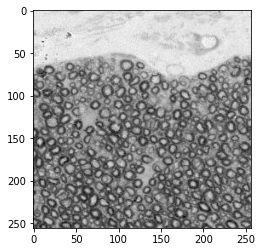

In [27]:
# Load data
files = ["extra_point.png" ]
real_data = cv.imread(path_folder+ files[0])

# Plot image
plt.imshow(real_data[:256, :256])

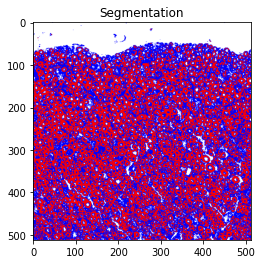

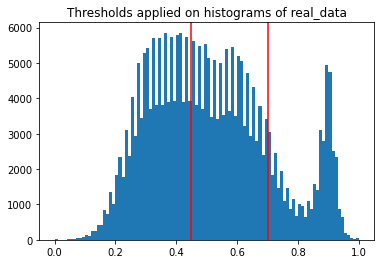

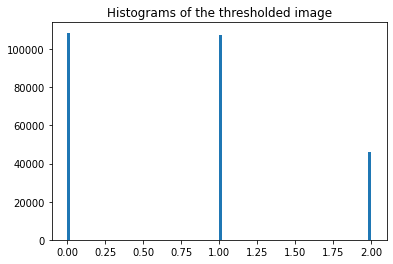

In [28]:
# Do the segmentation

    # Convert to gray scale
real_data = color.rgb2gray(real_data)

    # Applying multi-Otsu threshold for the default value, generating three classes
thresholds = threshold_multiotsu(real_data, 3, 500)

    # Using the threshold values, we generate the three regions
real_data_th = np.digitize(real_data, bins=thresholds)


    # Plotting results of segmentation

palette = np.array([[255,   0,   0],   # red
                    [  0,   0, 255],   # blue
                    [255, 255, 255]])  # white

real_data_th_RBW = palette[real_data_th] # image in Red Blue White

    # Plot segmented image
plt.imshow(real_data_th_RBW)
plt.title('Segmentation')
plt.show()

    # Plotting the histogram and the three thresholds obtained from multi-Otsu on real_data
plt.hist(real_data.ravel(), bins=100)
plt.title("Thresholds applied on histograms of real_data")
for th in thresholds:
    plt.axvline(th, color='r')
plt.show()    

    # Plotting the histogram of real_data_th
plt.hist(real_data_th.ravel(), bins=100)
plt.title("Histograms of the thresholded image")
plt.show()

**The segmentation is correct for the contour of the axons. However, the difference between the background and the inner part of the axons is not clear, and the two are mixed together.**